# HR Analytics Project- Understanding the Attrition in HR

# Problem Statement:

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

In [1]:
# Importing some neccessary liabraries which will help us to understand and visualize data

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [3]:
df.shape

(1470, 35)

We have total 1470 rows and 35 coumns. We need to check unnecessary columns so that we can train good model.

In [4]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

Having look on which are the features actully present in dataset by names.

In [5]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [6]:
df.drop("EmployeeCount",axis=1,inplace=True)
df.drop("Over18",axis=1,inplace=True)
df.drop("StandardHours",axis=1,inplace=True)

In [7]:
df.shape

(1470, 32)

We have droped those columns

In [8]:
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,2061,3,...,3,3,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,2062,4,...,3,1,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2064,2,...,4,2,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,2065,4,...,3,4,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,2068,2,...,3,1,0,6,3,4,4,3,1,2


In [9]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2


Just Obesrving data

In [10]:
df.sample(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1337,28,No,Travel_Rarely,1172,Sales,3,3,Medical,1875,2,...,3,4,1,1,3,3,1,0,0,0
643,42,No,Travel_Rarely,1265,Research & Development,3,3,Life Sciences,894,3,...,3,2,1,17,1,2,5,3,1,3
722,38,No,Travel_Frequently,1391,Research & Development,10,1,Medical,1006,3,...,3,2,1,3,0,2,2,1,0,2
1453,36,No,Travel_Rarely,1120,Sales,11,4,Marketing,2045,2,...,3,1,1,8,2,2,6,3,0,0
1165,44,No,Travel_Frequently,602,Human Resources,1,5,Human Resources,1642,1,...,3,3,0,14,3,3,10,7,0,2


In [11]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

So we can see there are no null values present is dataset which is good dataset signle. original values are always good

In [12]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany      

In [13]:
# Handling Objest using LabelEncoder

from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()

list=['Attrition','BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus','OverTime']

for i in list:
    df[i]=le.fit_transform(df[i].astype(str))

In [14]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,7,1,...,3,4,1,6,3,3,2,2,2,2


We have encoded our obeject data and ready to procced further

In [15]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Age                       1470 non-null   int64
 1   Attrition                 1470 non-null   int32
 2   BusinessTravel            1470 non-null   int32
 3   DailyRate                 1470 non-null   int64
 4   Department                1470 non-null   int32
 5   DistanceFromHome          1470 non-null   int64
 6   Education                 1470 non-null   int64
 7   EducationField            1470 non-null   int32
 8   EmployeeNumber            1470 non-null   int64
 9   EnvironmentSatisfaction   1470 non-null   int64
 10  Gender                    1470 non-null   int32
 11  HourlyRate                1470 non-null   int64
 12  JobInvolvement            1470 non-null   int64
 13  JobLevel                  1470 non-null   int64
 14  JobRole                   1470 non-null 

Observation

* Data has no null value
* All columns are now in integers data type
* Our data holds 321.7 KB space.

In [16]:
# Checking for blank space in data
df.loc[df['Age']==" "]


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


We can see we dont have any blank space in data

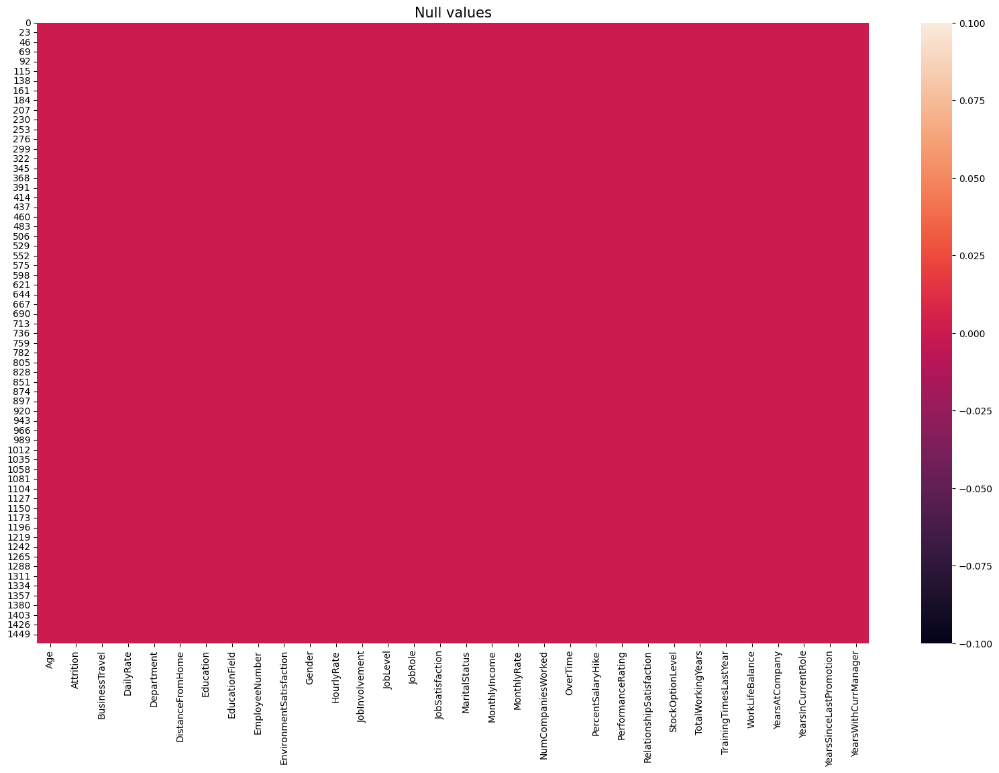

In [17]:
plt.figure(figsize=(20,12))
plt.title("Null values",fontsize=15)
sns.heatmap(df.isnull());


We can observe Null values in hit map and I dont see any Null value present in data set.

<Axes: >

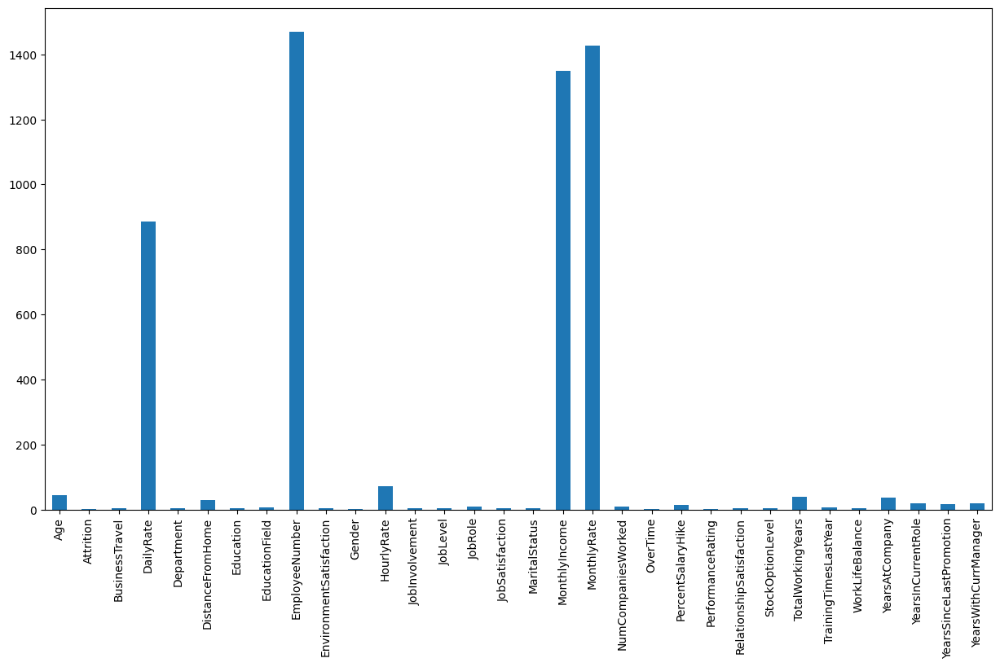

In [18]:
count = df.nunique()

plt.figure(figsize=(15,8))
count.plot(kind='bar')



Trying to observe uniquness of dats using graph

# Visulization to undertans data trend

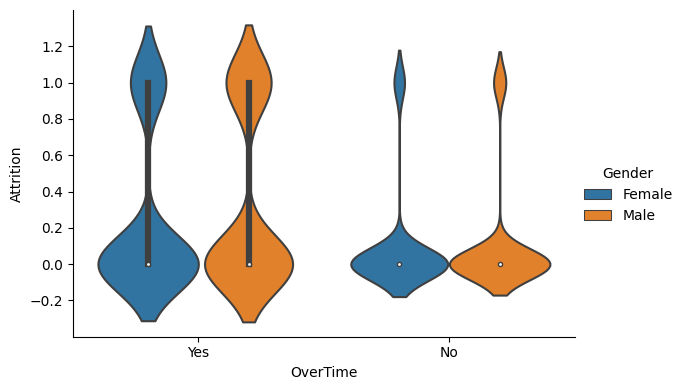

In [19]:
df2=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
df2['Attrition']=df['Attrition']
sns.catplot(x='OverTime',
            y='Attrition',
            hue='Gender',
            data=df2,
            height=4,aspect=1.5,
            kind='violin')

We can see that employees who does not work extra hour they left company most.

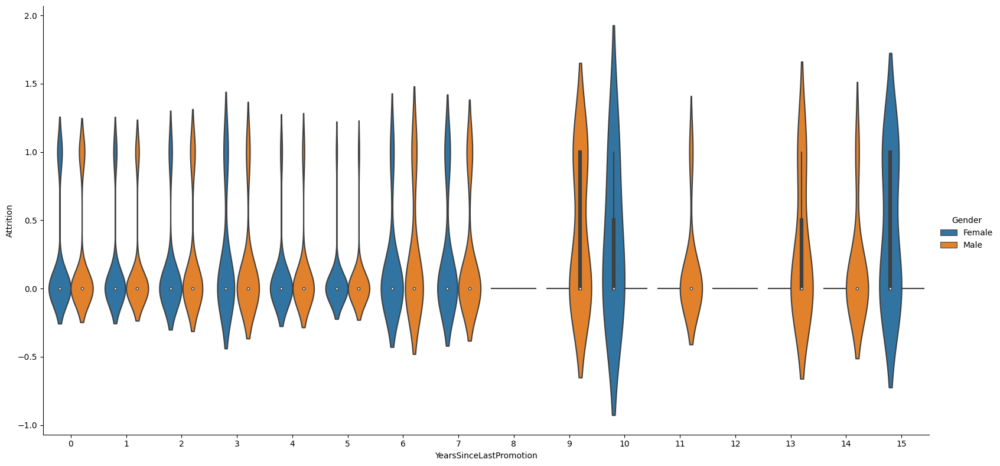

In [20]:
sns.catplot(x='YearsSinceLastPromotion',
            y='Attrition',
            hue='Gender',
            data=df2,
            height=8,aspect=2,
            kind='violin')

We can see that most of employees left becasue they are not getting promotion.Attrition count is high for those employees who dod not promoted for more than 6 years which is very long period

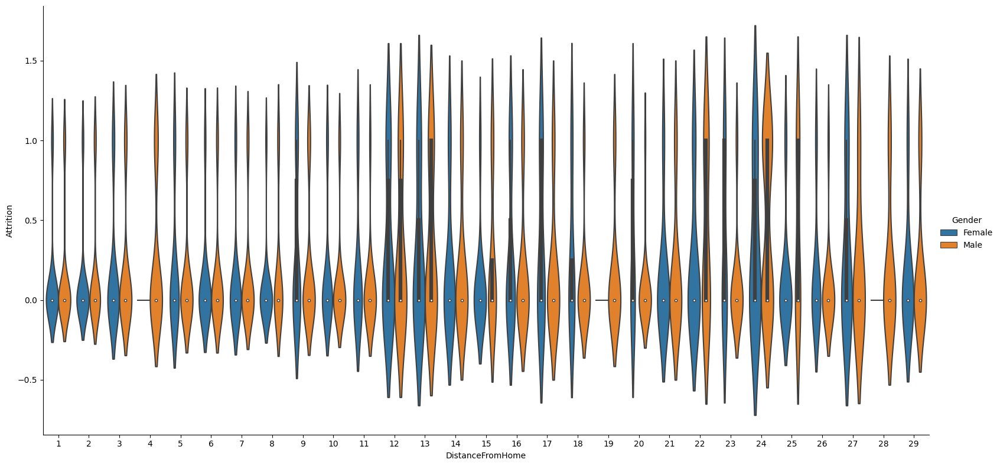

In [21]:
sns.catplot(x='DistanceFromHome',
            y='Attrition',
            hue='Gender',
            data=df2,
            height=8,aspect=2,
            kind='violin')

Some employees are left due to long distane between office and hoem

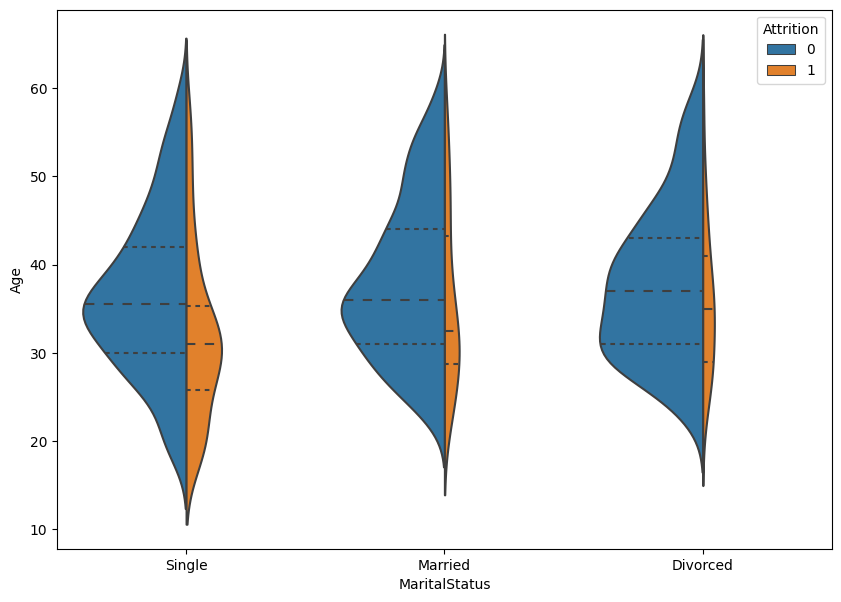

In [22]:
plt.figure(figsize=(10,7))
sns.violinplot(x="MaritalStatus", y="Age", hue="Attrition", data=df2, 
              split=True, scale="count", inner="quartile")
plt.show()

We can see the sigles are the high coutns who left jobs

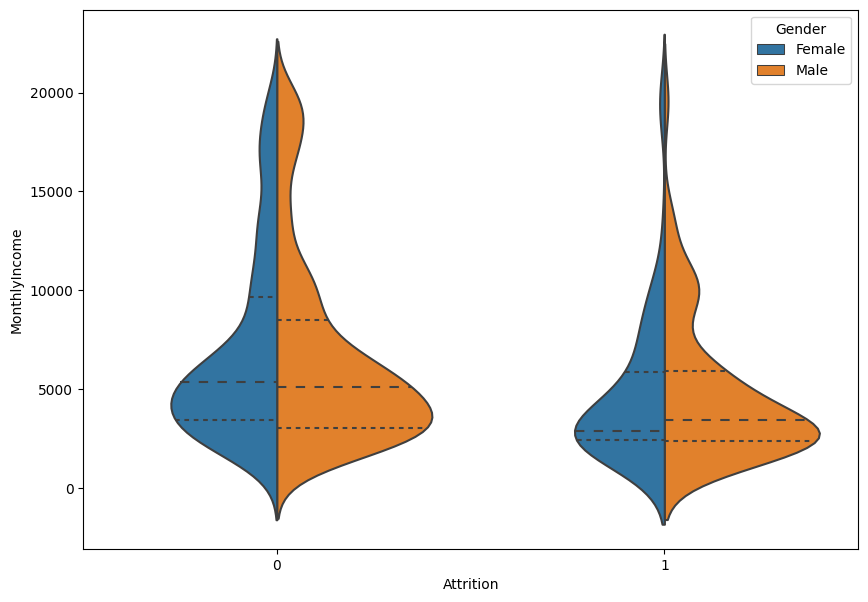

In [23]:
plt.figure(figsize=(10,7))
sns.violinplot(x="Attrition", y="MonthlyIncome", hue="Gender", data=df2, 
                split=True, scale="count", inner="quartile")
plt.show()

In [24]:
visdf=df2[df2.Attrition>0]
visdf

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
14,28,1,Travel_Rarely,103,Research & Development,24,3,Life Sciences,1,19,...,2,80,0,6,4,3,4,2,0,3
21,36,1,Travel_Rarely,1218,Sales,9,4,Life Sciences,1,27,...,2,80,0,10,4,3,5,3,0,3
24,34,1,Travel_Rarely,699,Research & Development,6,1,Medical,1,31,...,3,80,0,8,2,3,4,2,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1438,23,1,Travel_Frequently,638,Sales,9,3,Marketing,1,2023,...,1,80,1,1,3,2,1,0,1,0
1442,29,1,Travel_Rarely,1092,Research & Development,1,4,Medical,1,2027,...,2,80,3,4,3,4,2,2,2,2
1444,56,1,Travel_Rarely,310,Research & Development,7,2,Technical Degree,1,2032,...,4,80,1,14,4,1,10,9,9,8
1452,50,1,Travel_Frequently,878,Sales,1,4,Life Sciences,1,2044,...,4,80,2,12,3,3,6,3,0,1


As we can see 237 rows are represent who left Job

While plotting above all violin plot I notice that always count was showing high becaseu we have already less count for who left job hence I was not able to visulice effectvely. but now I filtered only those row who left jot to see realtion between Attriton and other Varibales

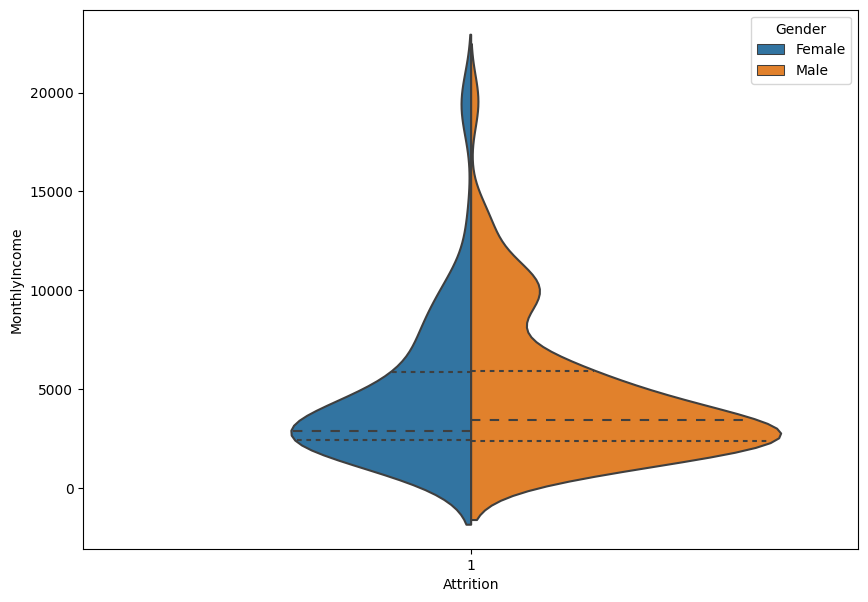

In [25]:
plt.figure(figsize=(10,7))
sns.violinplot(x="Attrition", y="MonthlyIncome", hue="Gender", data=visdf, 
                split=True, scale="count", inner="quartile")
plt.show()

Who can see that employees left are less who are earning good andt those employees who are having less salary they left Job early

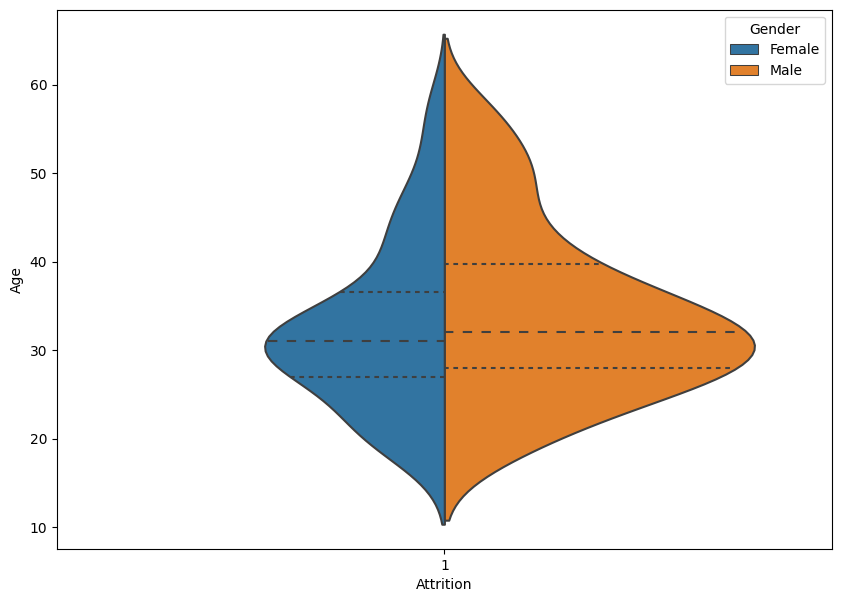

In [26]:
plt.figure(figsize=(10,7))
sns.violinplot(x="Attrition", y="Age", hue="Gender", data=visdf, 
                split=True, scale="count", inner="quartile")
plt.show()

Chances are high of leaving Job in Age of 25 to 30

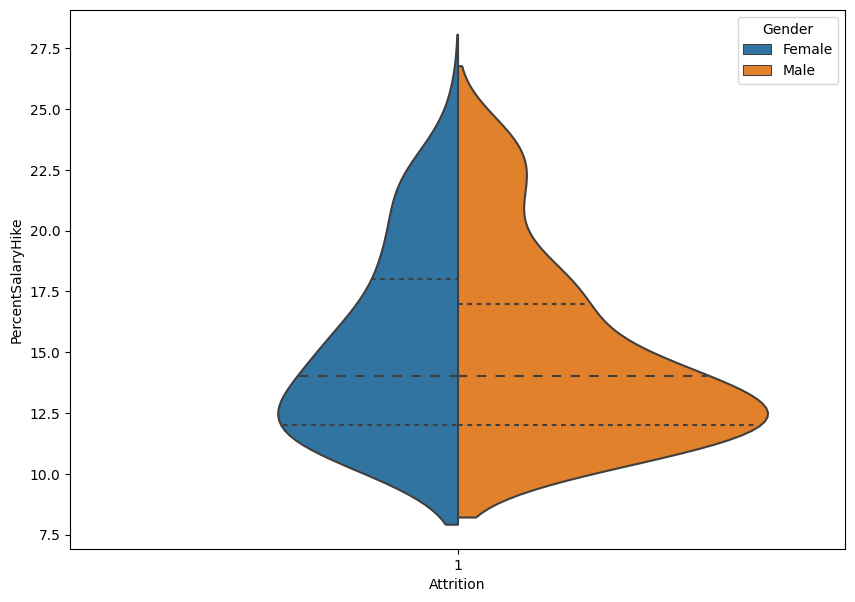

In [27]:
plt.figure(figsize=(10,7))
sns.violinplot(x="Attrition", y="PercentSalaryHike", hue="Gender", data=visdf, 
                split=True, scale="count", inner="quartile")
plt.show()

We can see that who got hike more that 15 they are staying with company. However those who are getting hike between 10 to 15 they are resigning most 

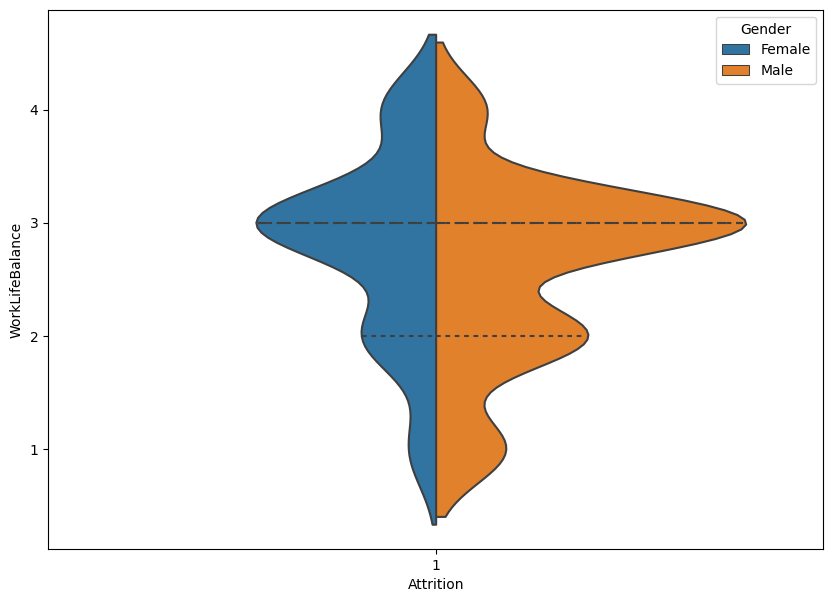

In [28]:
plt.figure(figsize=(10,7))
sns.violinplot(x="Attrition", y="WorkLifeBalance", hue="Gender", data=visdf, 
                split=True, scale="count", inner="quartile")
plt.show()

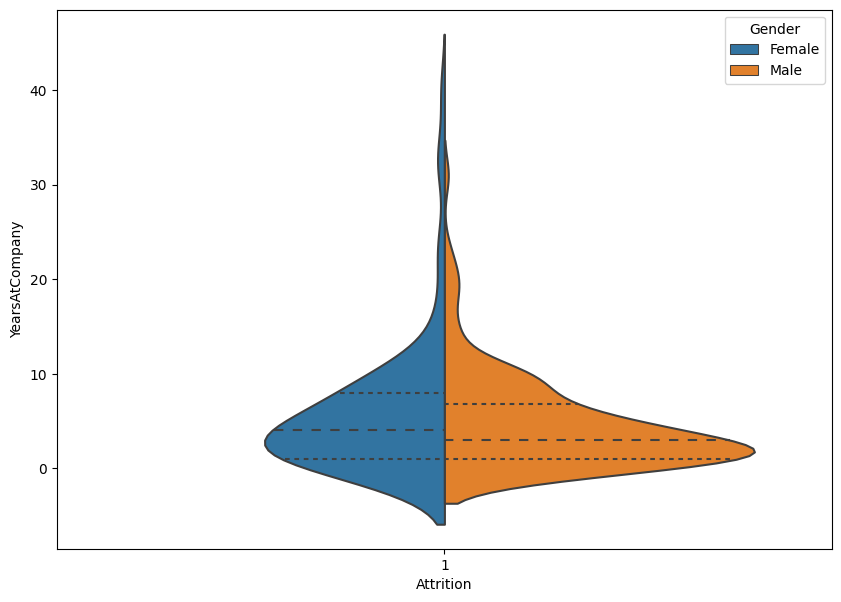

In [29]:
plt.figure(figsize=(10,7))
sns.violinplot(x="Attrition", y="YearsAtCompany", hue="Gender", data=visdf, 
                split=True, scale="count", inner="quartile")
plt.show()

We can see that resignation trend is high who spent 2 to 3 years in copmany However, those who spent more than 4 year in company the did not resign that mean they are enjyoing to work with this company

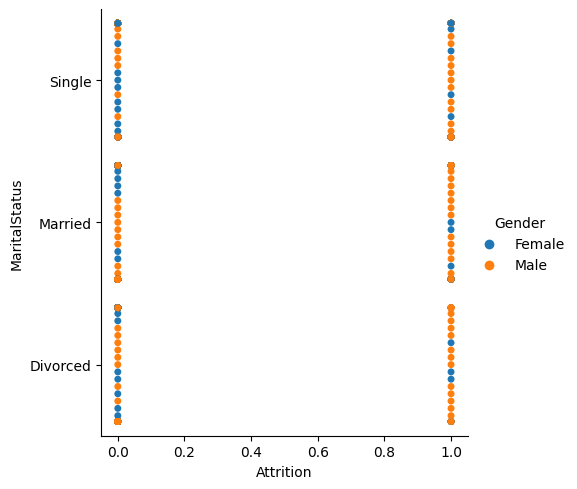

In [30]:
sns.catplot(data=df2, x="Attrition", y="MaritalStatus", hue="Gender", kind="swarm")

Single mens left job most

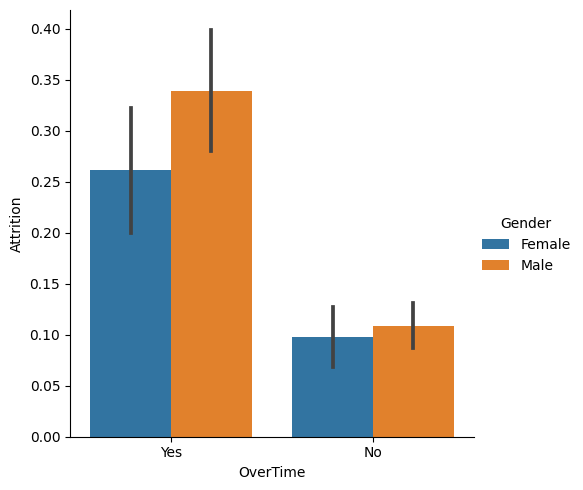

In [31]:
sns.catplot(
    data=df2, x="OverTime", y="Attrition", kind="bar",hue="Gender"
)

Males who are worikng in Overtime they left job most. those who are not working in extra hour they stay with company.

Leats check trend for continews variable

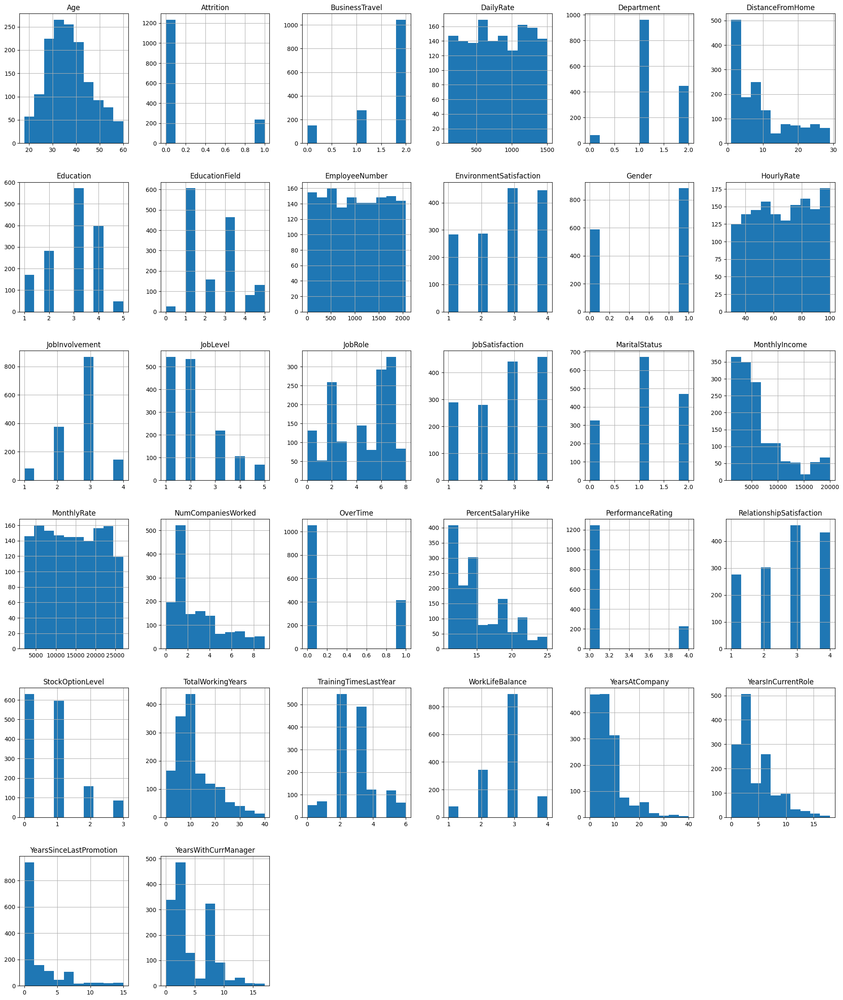

In [32]:
df.hist(figsize=(25,30))
plt.show()

we can see frequency of distrubution of data for each columns. As we can see monhtly rate,daily rate,Employee no has good frequency is Data

<Axes: xlabel='Attrition', ylabel='count'>

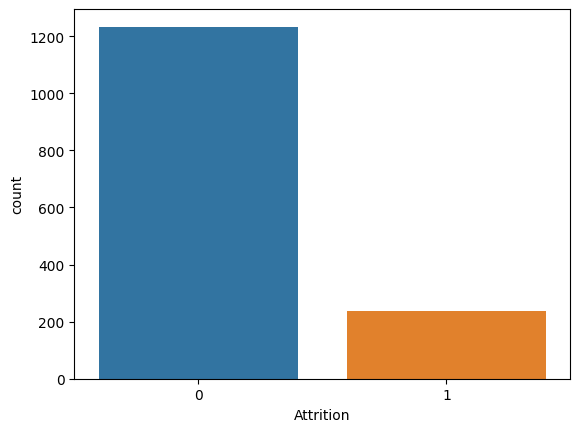

In [33]:
sns.countplot(x='Attrition',data=df)


We can see that our target "Attrition" is imbalance no of employees who left jobs are very less that who did not. So we need to use SMOT technique to balance data by adding dummy lines letter

<Axes: xlabel='DistanceFromHome', ylabel='Attrition'>

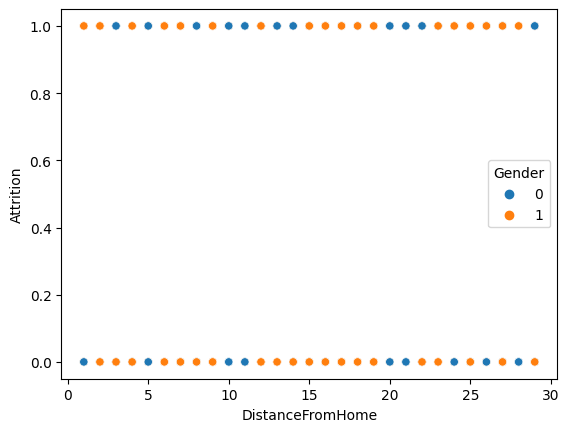

In [34]:
sns.scatterplot
sns.scatterplot(x="DistanceFromHome",y="Attrition",data=df,hue='Gender')

Employee do not stay for long time in company is if office location is very long from home

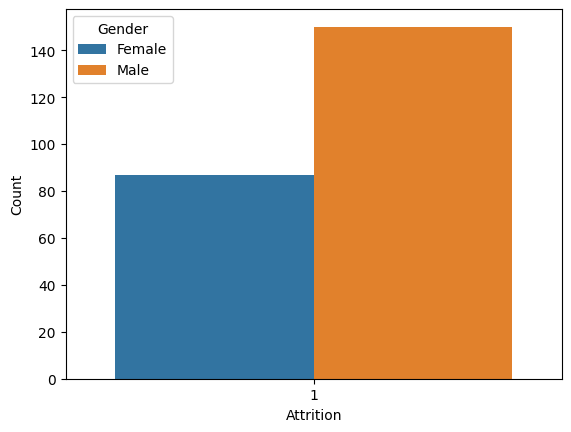

In [35]:
# Create a countplot with hue "Gender"
sns.countplot(x="Attrition", hue="Gender", data=visdf)

# Optional: Adding labels to the axes
plt.xlabel('Attrition')
plt.ylabel('Count')

# Show the plot
plt.show()


Abive graph only contain who left jon and we can see that Males are highest in that list

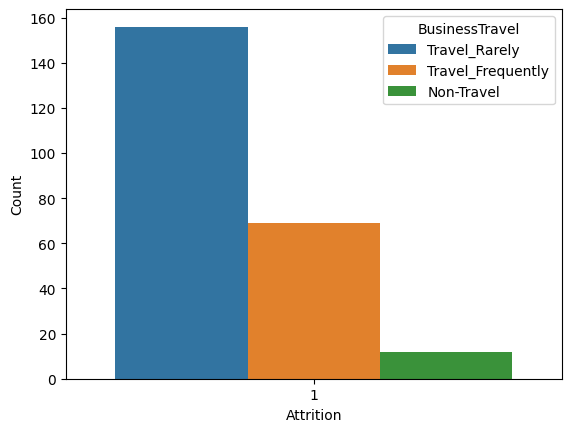

In [36]:
# Create a countplot with hue "BusinessTravel"
sns.countplot(x="Attrition", hue="BusinessTravel", data=visdf)

# Optional: Adding labels to the axes
plt.xlabel('Attrition')
plt.ylabel('Count')

# Show the plot
plt.show()


As per above graph we can see that those who Travel Rarely are higest who left Job. This is because of imbalanced dataset

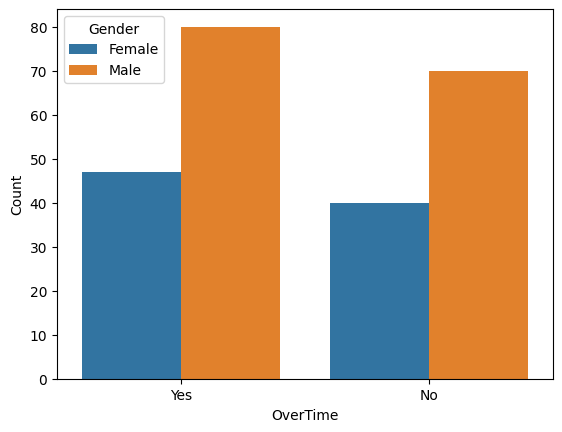

In [37]:
# Create a countplot with hue "Gender"
sns.countplot(x="OverTime", hue="Gender", data=visdf)

# Optional: Adding labels to the axes
plt.xlabel('OverTime')
plt.ylabel('Count')

# Show the plot
plt.show()


males count is high who are working extra hours and they left

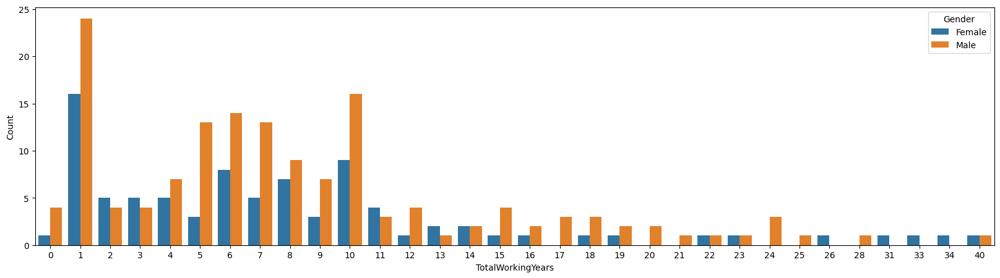

In [38]:
# Create a countplot with hue "Gender"
fig, ax = plt.subplots(figsize=(20, 5))
sns.countplot(x="TotalWorkingYears", hue="Gender", data=visdf, ax=ax)

# Optional: Adding labels to the axes
plt.xlabel('TotalWorkingYears')
plt.ylabel('Count')

# Show the plot
plt.show()


We can see that chnaces are getting low of leaving Jon when employee spent 10 yaers. Most of employees left before 10 year

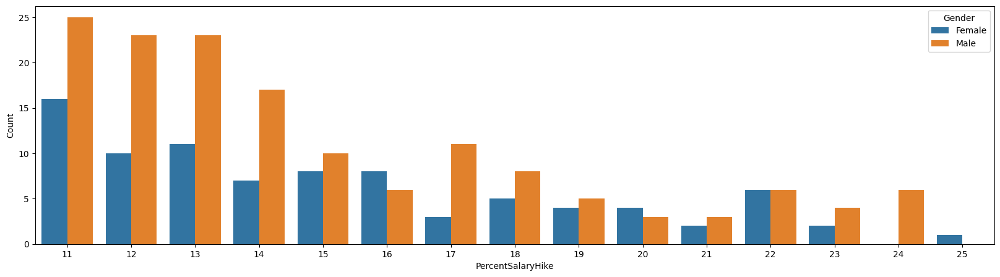

In [39]:
# Create a countplot with hue "Gender"
fig, ax = plt.subplots(figsize=(20, 5))
sns.countplot(x="PercentSalaryHike", hue="Gender", data=visdf, ax=ax)

# Optional: Adding labels to the axes
plt.xlabel('PercentSalaryHike')
plt.ylabel('Count')

# Show the plot
plt.show()


If Hike is high then Employee choose to continue with company

In [40]:
sns.pairplot(df)

I have observed above graph and find that very less linearity avaiable

In [41]:
# I am droping Empoyee Numebr Becasue it is not imporatant column.

df.drop("EmployeeNumber",axis=1,inplace=True)

In [42]:
df.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,0.010146,-0.036311,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,-0.103369,0.029453,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,0.004174,-0.032981,...,-0.026341,-0.035986,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,0.018355,-0.011716,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.019395,-0.041583,...,-0.024604,-0.022414,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,-0.016075,-0.001851,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,-0.027128,-0.016547,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,0.043163,-0.002504,...,-0.005614,-0.004378,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,1.000000,0.000508,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
Gender,-0.036311,0.029453,-0.032981,-0.011716,-0.041583,-0.001851,-0.016547,-0.002504,0.000508,1.000000,...,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599


Above graph show us corraltion of each and every column swith each other.

Lets see Correlation with Heatmap

<Axes: >

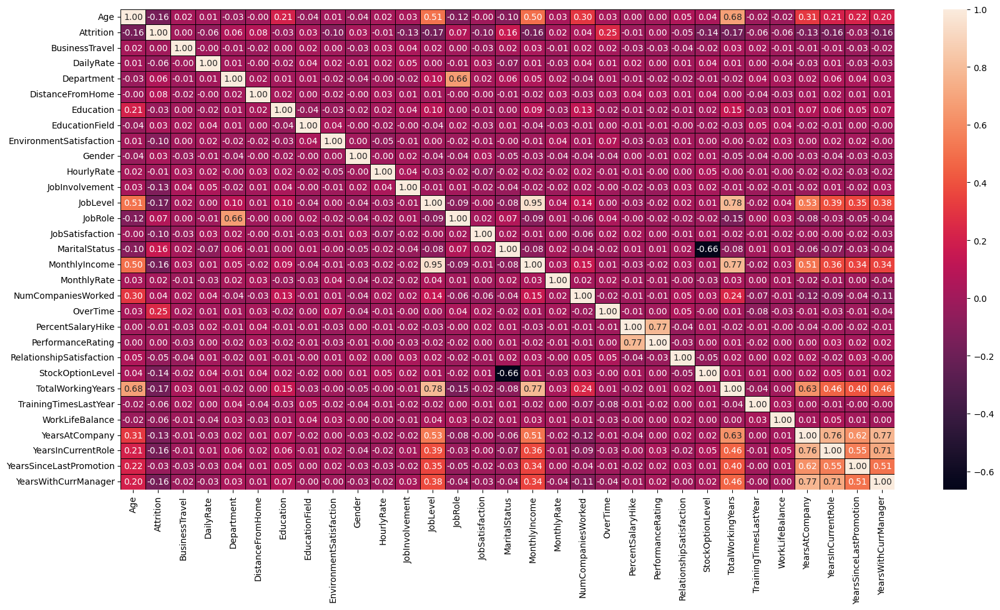

In [43]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(), annot=True, linewidths=0.6,linecolor="black", fmt='.2f')

I found some coluns who are havinf "0" correaltion with Taget as per below.

*PerformanceRating
*BusinessTravel

And there are some columns which are negative correlation and some of them have postive correlation

In [44]:
df.corr()['Attrition'].sort_values()

TotalWorkingYears          -0.171063
JobLevel                   -0.169105
YearsInCurrentRole         -0.160545
MonthlyIncome              -0.159840
Age                        -0.159205
YearsWithCurrManager       -0.156199
StockOptionLevel           -0.137145
YearsAtCompany             -0.134392
JobInvolvement             -0.130016
JobSatisfaction            -0.103481
EnvironmentSatisfaction    -0.103369
WorkLifeBalance            -0.063939
TrainingTimesLastYear      -0.059478
DailyRate                  -0.056652
RelationshipSatisfaction   -0.045872
YearsSinceLastPromotion    -0.033019
Education                  -0.031373
PercentSalaryHike          -0.013478
HourlyRate                 -0.006846
BusinessTravel              0.000074
PerformanceRating           0.002889
MonthlyRate                 0.015170
EducationField              0.026846
Gender                      0.029453
NumCompaniesWorked          0.043494
Department                  0.063991
JobRole                     0.067151
D

In [45]:
# Droping *PerformanceRating *BusinessTravel

df.drop('PerformanceRating',axis=1,inplace=True)
df.drop('BusinessTravel',axis=1,inplace=True)

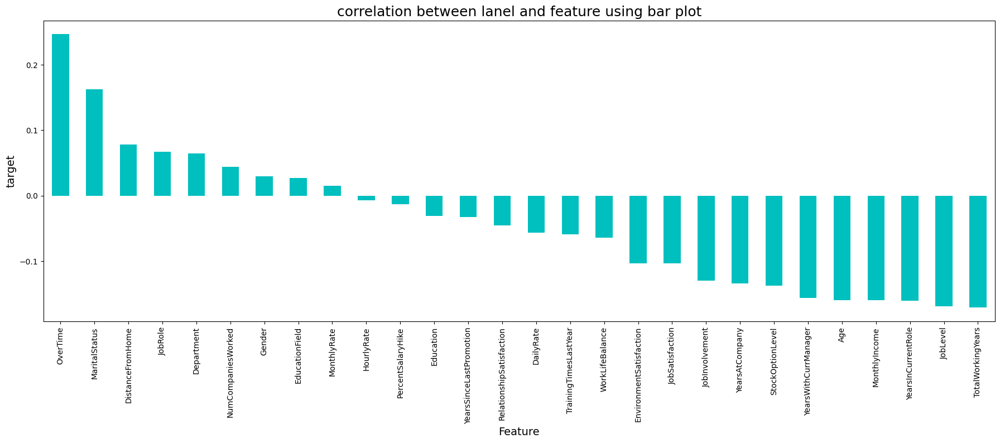

In [46]:
plt.figure(figsize=(22,7))
df.corr()['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('target',fontsize=14)
plt.title('correlation between lanel and feature using bar plot',fontsize=18)
plt.show()

In [47]:
# Droping Hourly rate as it has very less correlation
df.drop('HourlyRate',axis=1,inplace=True)


In [48]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.0,36.0,43.0,60.0
Attrition,1470.0,0.161224,0.367863,0.0,0.0,0.0,0.0,1.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.0,802.0,1157.0,1499.0
Department,1470.0,1.260544,0.527792,0.0,1.0,1.0,2.0,2.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.0,7.0,14.0,29.0
Education,1470.0,2.912925,1.024165,1.0,2.0,3.0,4.0,5.0
EducationField,1470.0,2.247619,1.331369,0.0,1.0,2.0,3.0,5.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.0,3.0,4.0,4.0
Gender,1470.0,0.600000,0.490065,0.0,0.0,1.0,1.0,1.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.0,3.0,3.0,4.0


In [49]:
df.shape

(1470, 28)

# Outliers Checking in Dataset

<function matplotlib.pyplot.show(close=None, block=None)>

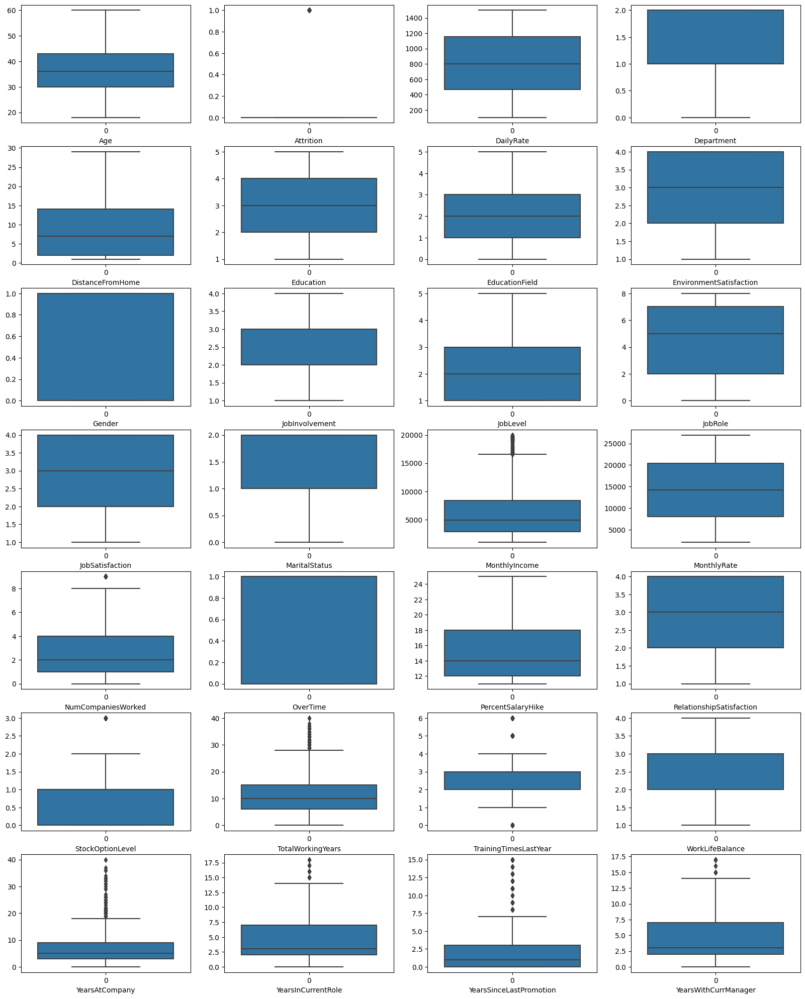

In [50]:
plt.figure(figsize=(20,25))

graph=1

for i in df:
    if graph<=28:
        plt.subplot(7,4,graph)
        sns.boxplot(data=df[i])
        plt.xlabel(i)
    graph+=1    
    
plt.show

In [51]:
# Lets treat outliers now

from scipy.stats import zscore
zscore=zscore(df)
zabs=np.abs(zscore)

z=df[(zabs<3).all(axis=1)]

In [52]:
z.shape

(1387, 28)

In [53]:
df.shape

(1470, 28)

In [54]:
loss=(1470-1387)/1470*100
loss

5.646258503401361

5 % Loss is ok

In [55]:
dropindex=df.index.difference(z.index)
dropindex

Index([  28,   45,   62,   63,   64,   85,   98,  110,  123,  126,  153,  178,
        187,  190,  218,  231,  237,  270,  281,  326,  386,  401,  411,  425,
        427,  445,  466,  473,  477,  535,  561,  584,  592,  595,  616,  624,
        635,  653,  677,  686,  701,  716,  746,  749,  752,  799,  838,  861,
        875,  894,  914,  918,  922,  926,  937,  956,  962,  976, 1008, 1024,
       1043, 1078, 1086, 1093, 1111, 1116, 1135, 1138, 1156, 1184, 1221, 1223,
       1242, 1295, 1301, 1303, 1327, 1331, 1348, 1351, 1401, 1414, 1430],
      dtype='int64')

In [56]:
df.drop(dropindex,inplace=True)
df

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,1,2,1,2,0,3,...,11,1,0,8,0,1,6,4,0,5
1,49,0,279,1,8,1,1,3,1,2,...,23,4,1,10,3,3,10,7,1,7
2,37,1,1373,1,2,2,4,4,1,2,...,15,2,0,7,3,3,0,0,0,0
3,33,0,1392,1,3,4,1,4,0,3,...,11,3,0,8,3,3,8,7,3,0
4,27,0,591,1,2,1,3,1,1,3,...,12,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,884,1,23,2,3,3,1,4,...,17,3,1,17,3,3,5,2,0,3
1466,39,0,613,1,6,1,3,4,1,2,...,15,1,1,9,5,3,7,7,1,7
1467,27,0,155,1,4,3,1,2,1,4,...,20,2,1,6,0,3,6,2,0,3
1468,49,0,1023,2,2,3,3,4,1,2,...,14,4,0,17,3,2,9,6,0,8


<function matplotlib.pyplot.show(close=None, block=None)>

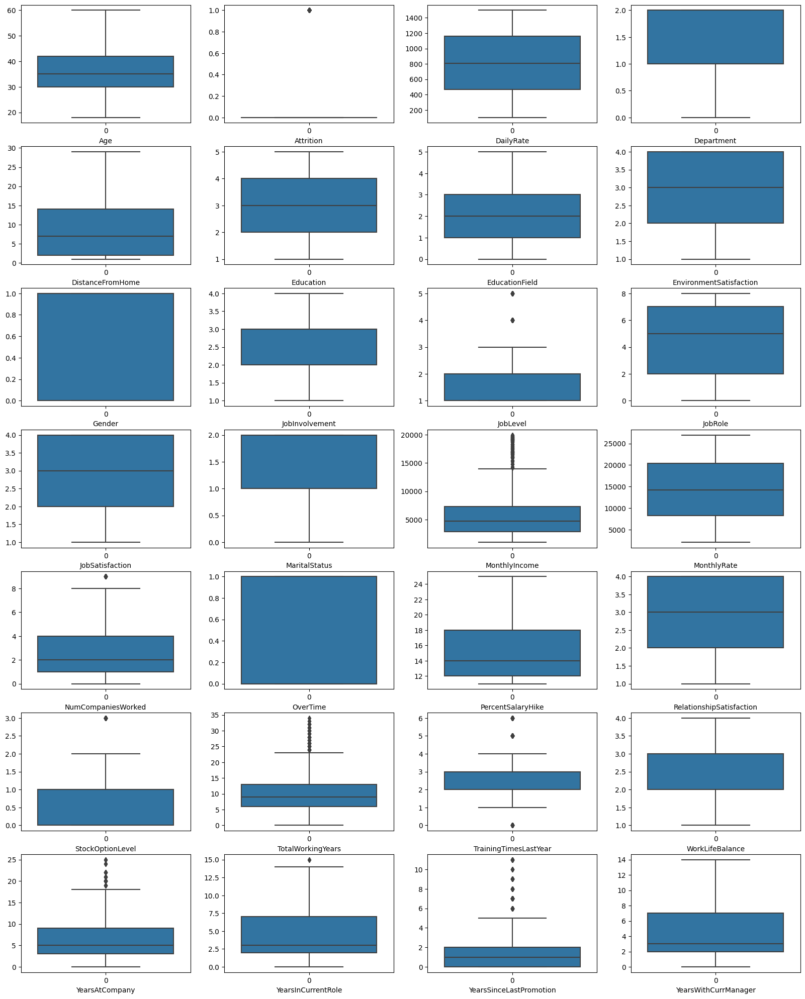

In [57]:
plt.figure(figsize=(20,25))

graph=1

for i in df:
    if graph<=28:
        plt.subplot(7,4,graph)
        sns.boxplot(data=df[i])
        plt.xlabel(i)
    graph+=1    
    
plt.show

We can see that we have removed outliers. Still we have some present However we can not treat again. 

# Skewness of data

In [58]:
df.skew()

Age                         0.472280
Attrition                   1.805983
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
YearsAtCompany              1.248623
YearsInCurrentRole          0.726675
YearsSinceLastPromotion     1.756335
Y

<function matplotlib.pyplot.show(close=None, block=None)>

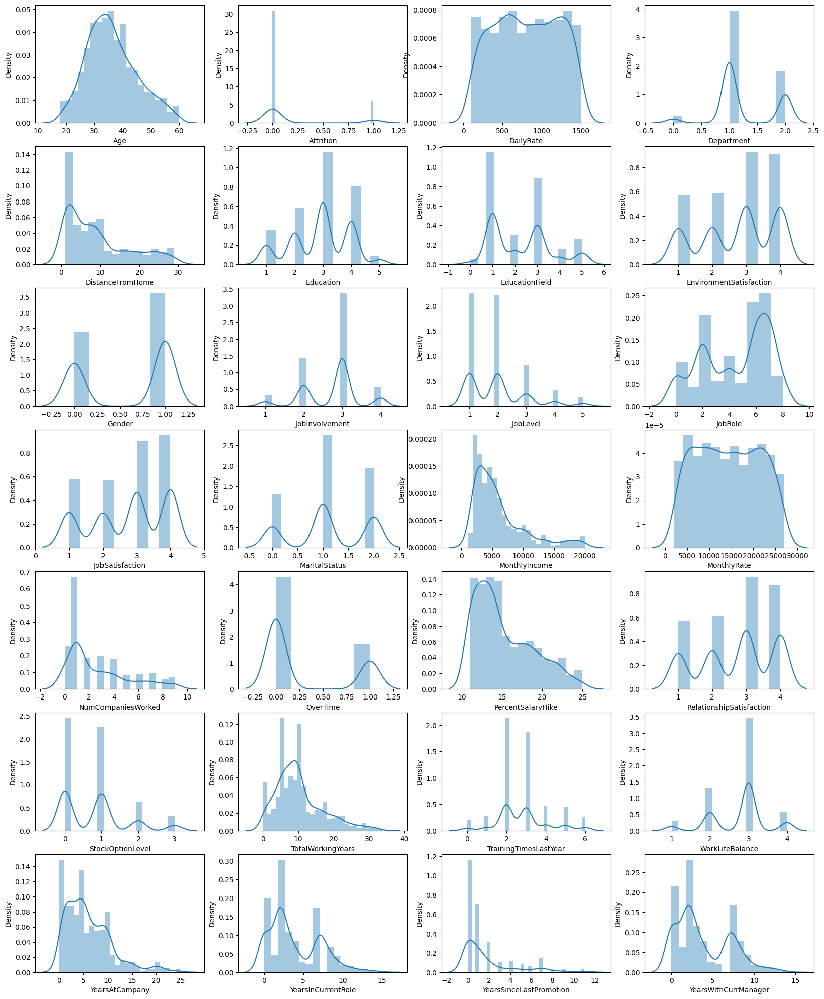

In [59]:
# Ploting on graph to better visualization

plt.figure(figsize=(20,25),facecolor="white")

plot=1

for i in df:
    if plot<=28:
        plt.subplot(7,4,plot)
        sns.distplot(df[i])
        plt.xlabel(i)
    plot+=1    
    
plt.show

# Defining x and Y

In [60]:
x = df.drop("Attrition", axis=1)
y = df["Attrition"]

In [61]:
x.shape

(1387, 27)

In [62]:
y.shape

(1387,)

# Removing Skewness using yeo-johnson method

In [63]:
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[ 0.61013332,  0.75061538,  1.37988121, ...,  0.29052433,
        -1.07353381,  0.58217664],
       [ 1.37182973, -1.34337244, -0.4734996 , ...,  1.0065754 ,
         0.19316755,  1.01807316],
       [ 0.18248603,  1.33708042, -0.4734996 , ..., -1.57181404,
        -1.07353381, -1.52842596],
       ...,
       [-1.0804891 , -1.75453754, -0.4734996 , ..., -0.39076907,
        -1.07353381,  0.01867962],
       [ 1.37182973,  0.57328582,  1.37988121, ...,  0.79376377,
        -1.07353381,  1.20578193],
       [-0.16377603, -0.37222758, -0.4734996 , ..., -0.01873824,
         0.19316755, -0.3478709 ]])

In [64]:
df.columns

Index(['Age', 'Attrition', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [65]:
Columnsname=['Age', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager']

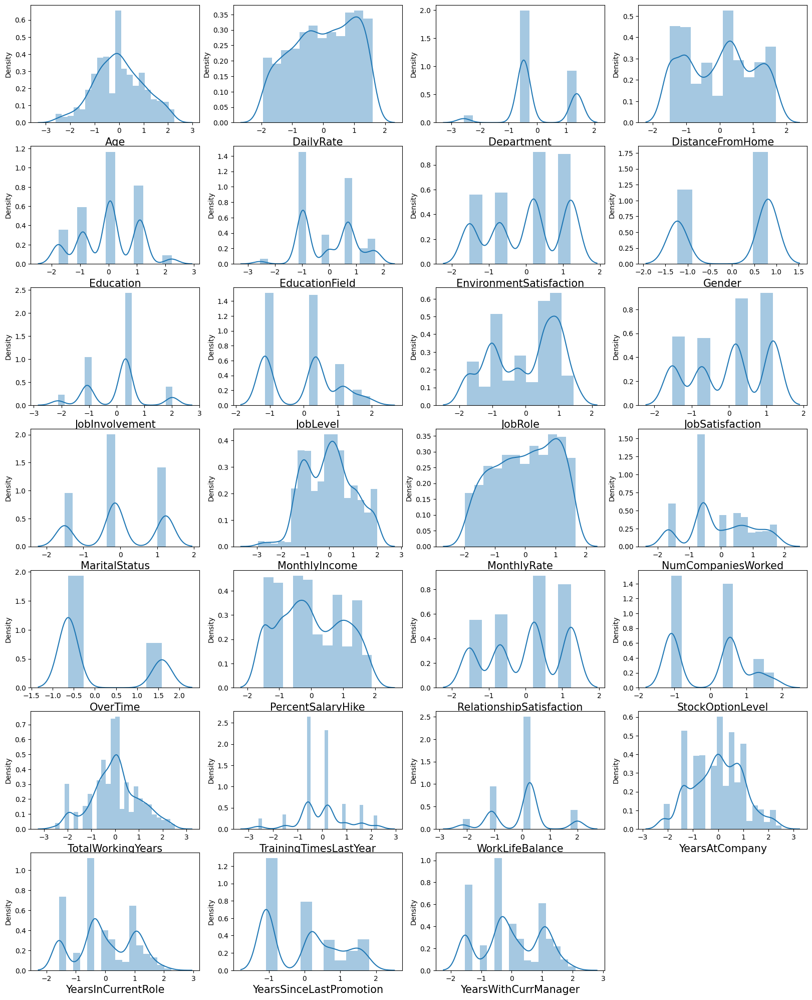

In [66]:
new_x=pd.DataFrame(data=x,columns=Columnsname)

plt.figure(figsize=(20,25),facecolor='white')

plotn=1

for col in new_x:
    if plotn<=27:
        plt.subplot(7,4,plotn)
        sns.distplot(new_x[col])
        plt.xlabel(col,fontsize=15)
        
    plotn+=1   
    
plt.show() 

We removed Skewness now

# We Have Observed Previously that ther is class Imbalace available in Attrition so we need to do oversamplin using SMOT

In [67]:
y.value_counts()

Attrition
0    1158
1     229
Name: count, dtype: int64

In [68]:
pip install -U imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [69]:
#Increasing count of "1" Which is Atrrition "yes"


from imblearn.over_sampling import SMOTE
oversample = SMOTE()
x, y = oversample.fit_resample(x, y)

In [70]:
y.value_counts()

Attrition
1    1158
0    1158
Name: count, dtype: int64

In [71]:
x.shape

(2316, 27)

We have equalized our data now which will not create bias

# Feature Scaling

In [72]:
from sklearn.preprocessing import StandardScaler




scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=Columnsname)
x.head()

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,PercentSalaryHike,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.764326,0.847744,1.332365,-1.663968,-0.947494,-1.009049,-0.619908,-1.362172,0.447587,0.555508,...,-1.539738,-1.522881,-0.940453,0.044655,-2.682524,-2.094746,0.436368,0.480964,-1.068327,0.773075
1,1.508028,-1.358480,-0.530956,0.160382,-1.877065,-1.009049,0.315073,0.796869,-1.002977,0.555508,...,1.766841,1.340934,0.705433,0.357411,0.277322,0.322653,1.153226,1.213136,0.245784,1.212735
2,0.346782,1.465643,-0.530956,-1.178462,-0.947494,1.248446,1.339948,0.796869,-1.002977,-0.967622,...,0.213557,-0.657471,-0.940453,-0.128778,0.277322,0.322653,-1.952810,-1.423302,-1.068327,-1.355749
3,-0.109402,1.507786,-0.530956,-0.831189,1.227257,-1.009049,1.339948,-1.362172,0.447587,-0.967622,...,-1.539738,0.302986,-0.940453,0.044655,0.277322,0.322653,0.826164,1.213136,1.111364,-1.355749
4,-0.886356,-0.435452,-0.530956,-1.178462,-1.877065,0.685711,-1.446469,0.796869,0.447587,-0.967622,...,-0.981347,1.340934,0.705433,-0.316804,0.277322,0.322653,-0.730063,-0.215667,0.795315,-0.165002


In [73]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [74]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif

,Features,VIF values
0,Age,2.197018
1,DailyRate,1.046407
2,Department,2.663892
3,DistanceFromHome,1.047767
4,Education,1.075247
5,EducationField,1.066509
6,EnvironmentSatisfaction,1.045865
7,Gender,1.037488
8,JobInvolvement,1.037119
9,JobLevel,6.141169


We do not have high multicolinarity so no need to treatr

We are ready to train model now

In [75]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Finding best random state

In [76]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.metrics import classification_report
from sklearn import metrics

maxAcc = 0
maxRS = 0

for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=i)
    modRF = RandomForestClassifier()
    modRF.fit(x_train,y_train)
    pred = modRF.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRs=i
print(f"Best Accuracy is: {maxAcc} on Random State: {maxRs}")

Best Accuracy is: 0.9698275862068966 on Random State: 99


# We have found best random state as 99 with 96 accuracy

In [78]:
LOGR = LogisticRegression(solver = 'liblinear')
RFC = RandomForestClassifier()
DTC = DecisionTreeClassifier()
SV = SVC()
GB=GradientBoostingClassifier()

model=[LOGR,RFC,DTC,SV,GB]

for i in model:
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=99)
    i.fit(x_train,y_train)
    predi=i.predict(x_test)
    print('performance matrix of',i,'is:')
    print("Confusion matrix :",confusion_matrix(y_test,predi))
    print("Classification report :", classification_report(y_test,predi,))
    print("Accuracy score :", accuracy_score(y_test,predi))
    print("*****************************************************************")

performance matrix of LogisticRegression(solver='liblinear') is:
Confusion matrix : [[189  51]
 [ 44 180]]
Classification report :               precision    recall  f1-score   support

           0       0.81      0.79      0.80       240
           1       0.78      0.80      0.79       224

    accuracy                           0.80       464
   macro avg       0.80      0.80      0.80       464
weighted avg       0.80      0.80      0.80       464

Accuracy score : 0.7952586206896551
*****************************************************************
performance matrix of RandomForestClassifier() is:
Confusion matrix : [[231   9]
 [  9 215]]
Classification report :               precision    recall  f1-score   support

           0       0.96      0.96      0.96       240
           1       0.96      0.96      0.96       224

    accuracy                           0.96       464
   macro avg       0.96      0.96      0.96       464
weighted avg       0.96      0.96      0.96       4

In [79]:
from sklearn.model_selection import cross_val_score
j=[LOGR,RFC,DTC,SV,GB]
for n in j:
  print('Cross_Validation_score of',n,'is')
  score=cross_val_score(n,x,y,cv=5)
  print(score)
  print(score.mean())
  print(score.std())
  print('\n')

Cross_Validation_score of LogisticRegression(solver='liblinear') is
[0.79094828 0.77969762 0.79481641 0.77969762 0.80993521]
0.7910190288225218
0.011212450929304592


Cross_Validation_score of RandomForestClassifier() is
[0.79956897 0.98056156 0.9762419  0.96976242 0.97840173]
0.9409073136218067
0.0707615273386169


Cross_Validation_score of DecisionTreeClassifier() is
[0.71982759 0.89200864 0.85961123 0.88984881 0.9049676 ]
0.8532527742608178
0.06834972027844208


Cross_Validation_score of SVC() is
[0.87931034 0.92008639 0.91144708 0.89848812 0.92656587]
0.9071795635659493
0.016809887384210284


Cross_Validation_score of GradientBoostingClassifier() is
[0.58189655 0.96544276 0.96112311 0.95896328 0.96328294]
0.8861417293513071
0.15213792058832834




# Support vector is working well as accuracy is 91 and cross validation score in 90 which means 1 % difference between both which good

# Hypertunning parameter for SVC

In [80]:
from sklearn.model_selection import GridSearchCV


parameters={'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf', 'poly', 'sigmoid']}

In [81]:
GCV=GridSearchCV(SV,parameters,cv=5)
GCV.fit(x_train,y_train)
print(GCV.best_params_)

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [82]:
HR_model = SVC(C=10,gamma=0.1,kernel='rbf' )
HR_model.fit(x_train, y_train)
pred = HR_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

98.0603448275862


# Finally we are getting 98% Accuracy after tunning hyperparameters

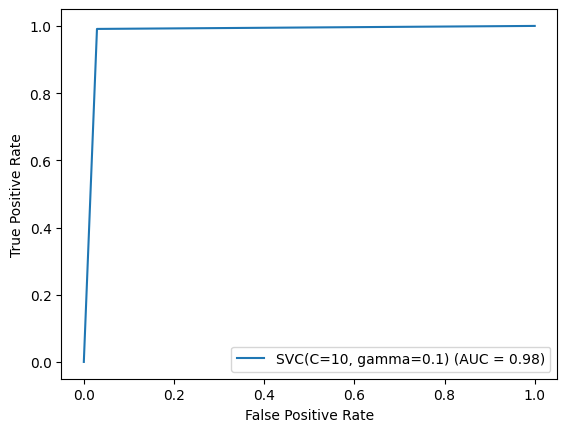

In [83]:
from sklearn import metrics
fpr,tpr,thresholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=HR_model)
display.plot()

# We can also see that AUC Curve for SVC it almost 99 we we will save our final mode SVC

In [84]:
# Saving the model using .pkl
import joblib
joblib.dump(HR_model,"HR_Model.pkl")

['HR_Model.pkl']

# Lets use model to predict again

In [85]:
# Loading the saved model
model=joblib.load("HR_Model.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1,

In [86]:
a=np.array(y_test)
result=pd.DataFrame({"Original":a,"Predicted":prediction})
result.head(25)

,Original,Predicted
0,0,0
1,1,1
2,1,1
3,0,0
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [87]:
acc=accuracy_score(y_test,prediction)
print(acc)

0.9806034482758621


# Finally I have Trained model with 98 % Accuracy

# Thank You